# ODE2VAE

First-order ODEs cannot model high-order dynamics such as acceleration or the motion of a pendulum, Moreover, ODEs are deterministic systems and cannot account for uncertainties in the dynamics.

First-order systems learn

$$\dot{\bf{z}}_{t}=\frac{\text{d}\bf{z}_{t}}{\text{d}t}=\bf{f}(\bf{z}_{t})$$

ODE2VAE uses Bayesian neural second-order ODEs to model data dynamics for sequential data

$$\ddot{\bf{z}}_{t}=\frac{\text{d}^{2}\bf{z}_{t}}{\text{d}^{2}t}=\bf{f}_\mathcal{W}(\bf{z}_{t},\dot{\bf{z}}_{t})$$

which can be reduced to a system of two coupled first-order ODEs

$$\left\{\begin{matrix}
\dot{\bf{s}}_{t} & = & \bf{v}_{t}\\ 
\dot{\bf{v}}_{t} & = & \bf{f}_\mathcal{W}(\bf{s}_{t},\bf{v}_{t})
\end{matrix}\right.,\begin{bmatrix}
\bf{s}_\mathit{T}\\ 
\bf{v}_\mathit{T}
\end{bmatrix}=\begin{bmatrix}
\bf{s}_0\\ 
\bf{v}_0
\end{bmatrix}+\int_{0}^{T}\begin{bmatrix}
\bf{v}_{t}\\ 
\bf{f}_\mathcal{W}(\bf{s}_{t},\bf{v}_{t})
\end{bmatrix}dt$$

where $\bf{z}_{t}=(\bf{s}_t,\bf{v}_t)$, with $\bf{s}_t$ being the state position and $\bf{v}_t$ the state velocity. The change in velocity (acceleration) is modelled by a Bayesian neural network $\bf{f}_\mathcal{W}(\bf{s}_{t},\bf{v}_{t})$ with a collection of weight parameters $\mathcal{W}$.

![ode2 dynamics](https://i.ibb.co/ZXYr0HB/Picture1.png)

In the ODE2VAE model, the encoder for the initial position depends only on the first item in the data sequence. The encoder for the initial velocity depends of the first $m$ data points.

We minimize the ELBO given by

$$\log p(X)\geq \underbrace{-\mathrm{KL}[q(\mathcal{W})||p(\mathcal{W})]}_\text{ODE regularization}+\underbrace{\mathbb{E}_{q_{\text{enc}}(\bf{z}_{0}|X)}\left [-\log \frac{q_{\text{enc}}(\bf{z}_{0}|X)}{p(\bf{z}_{0})}]+\log p(\bf{x}_{0}|\bf{z}_{0}) \right ]}_\text{VAE loss}+\underbrace{\sum_{i=1}^{N}\mathbb{E}_{q_{\text{ode}}(\mathcal{W},\bf{z}_{i}|X,\bf{z}_{0})}\left [-\log \frac{q_{\text{ode}}(\bf{z}_{i}|\mathcal{W},X)}{p(\bf{z}_{i})}]+\log p(\bf{x}_{i}|\bf{z}_{i}) \right ]}_\text{dynamic loss}$$

The authors introduced two ELBO optimizing strategies to counter-balance the penalities on latent variables $\mathcal{W}$ and $\bf{z}_{i}$, and reduce underfitting in encoders when dynamic loss term dominates VAE loss. We finally have the following target function:

$$\mathcal{L}_{\text{ODE2VAE}} = -\beta \mathrm{KL}[q(\mathcal{W})||p(\mathcal{W})]+\mathbb{E}_{q(\mathcal{W},Z|X)}\left [-\log \frac{q(Z|\mathcal{W},X)}{p(Z)}]+\log p(X|\mathcal{W},Z) \right ]-\gamma \mathbb{E}_{q(\mathcal{W})}[\mathrm{KL}[q_{\text{ode}}(Z|X)||q_{\text{enc}}(Z|\mathcal{W},X)]]$$

![ode2vae animation](https://raw.githubusercontent.com/cagatayyildiz/ODE2VAE/master/images/ode2vae-anim.gif)

### Experimenting with ODE2VAE

Training on rotating MNIST dataset.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.parameter import Parameter
from torch.utils import data
from torch.distributions import MultivariateNormal, Normal, kl_divergence as kl
from torch_bnn import BNN
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from torchdiffeq import odeint

import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
# plt.switch_backend('agg')
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

from multiprocessing import Process, freeze_support
torch.multiprocessing.set_start_method('spawn', force="True")


# prepare dataset
class Dataset(data.Dataset):
    def __init__(self, Xtr):
        self.Xtr = Xtr # N,16,784
    def __len__(self):
        return len(self.Xtr)
    def __getitem__(self, idx):
        return self.Xtr[idx]
# read data
X = loadmat('rot-mnist-3s.mat')['X'].squeeze() # (N, 16, 784)
N = 500
T = 16
Xtr   = torch.tensor(X[:N],dtype=torch.float32).view([N,T,1,28,28])
Xtest = torch.tensor(X[N:],dtype=torch.float32).view([-1,T,1,28,28])
# Generators
params = {'batch_size': 25, 'shuffle': True, 'num_workers': 0}
trainset = Dataset(Xtr)
trainset = data.DataLoader(trainset, **params)
testset  = Dataset(Xtest)
testset  = data.DataLoader(testset, **params)

# utils
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)

class UnFlatten(nn.Module):
    def __init__(self,w):
        super().__init__()
        self.w = w
    def forward(self, input):
        nc = input[0].numel()//(self.w**2)
        return input.view(input.size(0), nc, self.w, self.w)


# model implementation
class ODE2VAE(nn.Module):
    def __init__(self, n_filt=8, q=8):
        super(ODE2VAE, self).__init__()
        h_dim = n_filt*4**3 # encoder output is [4*n_filt,4,4]
        # encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, n_filt, kernel_size=5, stride=2, padding=(2,2)), # 14,14
            nn.BatchNorm2d(n_filt),
            nn.ReLU(),
            nn.Conv2d(n_filt, n_filt*2, kernel_size=5, stride=2, padding=(2,2)), # 7,7
            nn.BatchNorm2d(n_filt*2),
            nn.ReLU(),
            nn.Conv2d(n_filt*2, n_filt*4, kernel_size=5, stride=2, padding=(2,2)),
            nn.ReLU(),
            Flatten()
        )

        self.fc1 = nn.Linear(h_dim, 2*q)
        self.fc2 = nn.Linear(h_dim, 2*q)
        self.fc3 = nn.Linear(q, h_dim)
        # differential function
        # to use a deterministic differential function, set bnn=False and self.beta=0.0
        self.bnn = BNN(2*q, q, n_hid_layers=2, n_hidden=50, act='celu', layer_norm=True, bnn=True)
        # downweighting the BNN KL term is helpful if self.bnn is heavily overparameterized
        self.beta = 1.0 # 2*q/self.bnn.kl().numel()
        # decoder
        self.decoder = nn.Sequential(
            UnFlatten(4),
            nn.ConvTranspose2d(h_dim//16, n_filt*8, kernel_size=3, stride=1, padding=(0,0)),
            nn.BatchNorm2d(n_filt*8),
            nn.ReLU(),
            nn.ConvTranspose2d(n_filt*8, n_filt*4, kernel_size=5, stride=2, padding=(1,1)),
            nn.BatchNorm2d(n_filt*4),
            nn.ReLU(),
            nn.ConvTranspose2d(n_filt*4, n_filt*2, kernel_size=5, stride=2, padding=(1,1), output_padding=(1,1)),
            nn.BatchNorm2d(n_filt*2),
            nn.ReLU(),
            nn.ConvTranspose2d(n_filt*2, 1, kernel_size=5, stride=1, padding=(2,2)),
            nn.Sigmoid(),
        )
        self._zero_mean = torch.zeros(2*q).to(device)
        self._eye_covar = torch.eye(2*q).to(device) 
        self.mvn = MultivariateNormal(self._zero_mean, self._eye_covar)

    def ode2vae_rhs(self,t,vs_logp,f):
        vs, logp = vs_logp # N,2q & N
        q = vs.shape[1]//2
        dv = f(vs) # N,q 
        ds = vs[:,:q]  # N,q
        dvs = torch.cat([dv,ds],1) # N,2q
        ddvi_dvi = torch.stack(
                    [torch.autograd.grad(dv[:,i],vs,torch.ones_like(dv[:,i]),
                    retain_graph=True,create_graph=True)[0].contiguous()[:,i]
                    for i in range(q)],1) # N,q --> df(x)_i/dx_i, i=1..q
        tr_ddvi_dvi = torch.sum(ddvi_dvi,1) # N
        return (dvs,-tr_ddvi_dvi)

    def elbo(self, qz_m, qz_logv, zode_L, logpL, X, XrecL, Ndata, qz_enc_m=None, qz_enc_logv=None):
        ''' Input:
                qz_m        - latent means [N,2q]
                qz_logv     - latent logvars [N,2q]
                zode_L      - latent trajectory samples [L,N,T,2q]
                logpL       - densities of latent trajectory samples [L,N,T]
                X           - input images [N,T,nc,d,d]
                XrecL       - reconstructions [L,N,T,nc,d,d]
                Ndata       - number of sequences in the dataset (required for elbo
                qz_enc_m    - encoder density means  [N*T,2*q]
                qz_enc_logv - encoder density variances [N*T,2*q]
            Returns:
                likelihood
                prior on ODE trajectories KL[q_ode(z_{0:T})||N(0,I)]
                prior on BNN weights
                instant encoding term KL[q_ode(z_{0:T})||q_enc(z_{0:T}|X_{0:T})] (if required) 
        '''
        [N,T,nc,d,d] = X.shape
        L = zode_L.shape[0]
        q = qz_m.shape[1]//2
        # prior
        log_pzt = self.mvn.log_prob(zode_L.contiguous().view([L*N*T,2*q])) # L*N*T
        log_pzt = log_pzt.view([L,N,T]) # L,N,T
        kl_zt   = logpL - log_pzt  # L,N,T
        kl_z    = kl_zt.sum(2).mean(0) # N
        kl_w    = self.bnn.kl().sum()
        # likelihood
        XL = X.repeat([L,1,1,1,1,1]) # L,N,T,nc,d,d 
        lhood_L = torch.log(1e-3+XrecL)*XL + torch.log(1e-3+1-XrecL)*(1-XL) # L,N,T,nc,d,d
        lhood = lhood_L.sum([2,3,4,5]).mean(0) # N
        if qz_enc_m is not None: # instant encoding
            qz_enc_mL    = qz_enc_m.repeat([L,1])  # L*N*T,2*q
            qz_enc_logvL = qz_enc_logv.repeat([L,1])  # L*N*T,2*q
            mean_ = qz_enc_mL.contiguous().view(-1) # L*N*T*2*q
            std_  = 1e-3+qz_enc_logvL.exp().contiguous().view(-1) # L*N*T*2*q
            qenc_zt_ode = Normal(mean_,std_).log_prob(zode_L.contiguous().view(-1)).view([L,N,T,2*q])
            qenc_zt_ode = qenc_zt_ode.sum([3]) # L,N,T
            inst_enc_KL = logpL - qenc_zt_ode
            inst_enc_KL = inst_enc_KL.sum(2).mean(0) # N
            return Ndata*lhood.mean(), Ndata*kl_z.mean(), kl_w, Ndata*inst_enc_KL.mean()
        else:
            return Ndata*lhood.mean(), Ndata*kl_z.mean(), kl_w

    def forward(self, X, Ndata, L=1, inst_enc=False, method='dopri5', dt=0.1):
        ''' Input
                X          - input images [N,T,nc,d,d]
                Ndata      - number of sequences in the dataset (required for elbo)
                L          - number of Monta Carlo draws (from BNN)
                inst_enc   - whether instant encoding is used or not
                method     - numerical integration method
                dt         - numerical integration step size 
            Returns
                Xrec_mu    - reconstructions from the mean embedding - [N,nc,D,D]
                Xrec_L     - reconstructions from latent samples     - [L,N,nc,D,D]
                qz_m       - mean of the latent embeddings           - [N,q]
                qz_logv    - log variance of the latent embeddings   - [N,q]
                lhood-kl_z - ELBO
                lhood      - reconstruction likelihood
                kl_z       - KL
        '''
        # encode
        [N,T,nc,d,d] = X.shape
        h = self.encoder(X[:,0])
        qz0_m, qz0_logv = self.fc1(h), self.fc2(h) # N,2q & N,2q
        q = qz0_m.shape[1]//2
        # latent samples
        eps   = torch.randn_like(qz0_m)  # N,2q
        z0    = qz0_m + eps*torch.exp(qz0_logv) # N,2q
        logp0 = self.mvn.log_prob(eps) # N 
        # ODE
        t  = dt * torch.arange(T,dtype=torch.float).to(z0.device)
        ztL   = []
        logpL = []
        # sample L trajectories
        for l in range(L):
            f       = self.bnn.draw_f() # draw a differential function
            oderhs  = lambda t,vs: self.ode2vae_rhs(t,vs,f) # make the ODE forward function
            zt,logp = odeint(oderhs,(z0,logp0),t,method=method) # T,N,2q & T,N
            ztL.append(zt.permute([1,0,2]).unsqueeze(0)) # 1,N,T,2q
            logpL.append(logp.permute([1,0]).unsqueeze(0)) # 1,N,T
        ztL   = torch.cat(ztL,0) # L,N,T,2q
        logpL = torch.cat(logpL) # L,N,T
        # decode
        st_muL = ztL[:,:,:,q:] # L,N,T,q
        s = self.fc3(st_muL.contiguous().view([L*N*T,q]) ) # L*N*T,h_dim
        Xrec = self.decoder(s) # L*N*T,nc,d,d
        Xrec = Xrec.view([L,N,T,nc,d,d]) # L,N,T,nc,d,d
        # likelihood and elbo
        if inst_enc:
            h = self.encoder(X.contiguous().view([N*T,nc,d,d]))
            qz_enc_m, qz_enc_logv = self.fc1(h), self.fc2(h) # N*T,2q & N*T,2q
            lhood, kl_z, kl_w, inst_KL = \
                self.elbo(qz0_m, qz0_logv, ztL, logpL, X, Xrec, Ndata, qz_enc_m, qz_enc_logv)
            elbo = lhood - kl_z - inst_KL - self.beta*kl_w
        else:
            lhood, kl_z, kl_w = self.elbo(qz0_m, qz0_logv, ztL, logpL, X, Xrec, Ndata)
            elbo = lhood - kl_z - self.beta*kl_w
        return Xrec, qz0_m, qz0_logv, ztL, elbo, lhood, kl_z, self.beta*kl_w

    def mean_rec(self, X, method='dopri5', dt=0.1):
        [N,T,nc,d,d] = X.shape
        # encode
        h = self.encoder(X[:,0])
        qz0_m = self.fc1(h) # N,2q
        q = qz0_m.shape[1]//2
        # ode
        def ode2vae_mean_rhs(t,vs,f):
            q = vs.shape[1]//2
            dv = f(vs) # N,q 
            ds = vs[:,:q]  # N,q
            return torch.cat([dv,ds],1) # N,2q
        f     = self.bnn.draw_f(mean=True) # use the mean differential function
        odef  = lambda t,vs: ode2vae_mean_rhs(t,vs,f) # make the ODE forward function
        t     = dt * torch.arange(T,dtype=torch.float).to(qz0_m.device)
        zt_mu = odeint(odef,qz0_m,t,method=method).permute([1,0,2]) # N,T,2q
        # decode
        st_mu = zt_mu[:,:,q:] # N,T,q
        s = self.fc3(st_mu.contiguous().view([N*T,q]) ) # N*T,q
        Xrec_mu = self.decoder(s) # N*T,nc,d,d
        Xrec_mu = Xrec_mu.view([N,T,nc,d,d]) # N,T,nc,d,d
        # error
        mse = torch.mean((Xrec_mu-X)**2)
        return Xrec_mu,mse

    def mean_rec2(self, X, method='dopri5', dt=0.1):
        [N,T,nc,d,d] = X.shape
        # encode
        h = self.encoder(X[:,0])
        qz0_m = self.fc1(h) # N,2q
        q = qz0_m.shape[1]//2
        # ode
        def ode2vae_mean_rhs(t,vs,f):
            q = vs.shape[1]//2
            dv = f(vs) # N,q 
            ds = vs[:,:q]  # N,q
            return torch.cat([dv,ds],1) # N,2q
        f     = self.bnn.draw_f(mean=True) # use the mean differential function
        odef  = lambda t,vs: ode2vae_mean_rhs(t,vs,f) # make the ODE forward function
        t     = dt * torch.arange(2*T,dtype=torch.float).to(qz0_m.device)
        zt_mu = odeint(odef,qz0_m,t,method=method).permute([1,0,2]) # N,T,2q
        # decode
        st_mu = zt_mu[:,:,q:] # N,T,q
        s = self.fc3(st_mu.contiguous().view([N*2*T,q]) ) # N*T,q
        Xrec_mu = self.decoder(s) # N*T,nc,d,d
        Xrec_mu = Xrec_mu.view([N,2*T,nc,d,d]) # N,T,nc,d,d
        # error
#         mse = torch.mean((Xrec_mu-X)**2)
        return Xrec_mu

# plotting
def plot_rot_mnist(X, Xrec):
    N = min(X.shape[0],10)
    Xnp = X.detach().cpu().numpy()
    Xrecnp = Xrec.detach().cpu().numpy()
    T = X.shape[1]
    plt.figure(2,(T,3*N))
    for i in range(N):
        for t in range(T):
            plt.subplot(2*N,T,i*T*2+t+1)
            plt.imshow(np.reshape(Xnp[i,t],[28,28]), cmap='gray')
            plt.xticks([]); plt.yticks([])
        for t in range(T):
            plt.subplot(2*N,T,i*T*2+t+T+1)
            plt.imshow(np.reshape(Xrecnp[i,t],[28,28]), cmap='gray')
            plt.xticks([]); plt.yticks([])
    plt.show()
    plt.close()

Iter:0  lhood:-319610.88  kl_z:4209.19   kl_w: 9569.03
Iter:1  lhood:-275481.78  kl_z:3243.26   kl_w: 9568.32
Iter:2  lhood:-219137.95  kl_z:3831.92   kl_w: 9567.89
Iter:3  lhood:-180430.94  kl_z:4033.58   kl_w: 9567.56
Iter:4  lhood:-151061.80  kl_z:2898.45   kl_w: 9567.32
Iter:5  lhood:-138019.72  kl_z:2578.60   kl_w: 9567.06
Iter:6  lhood:-136279.64  kl_z:2639.84   kl_w: 9566.83
Iter:7  lhood:-127542.16  kl_z:592.13    kl_w: 9566.61
Iter:8  lhood:-129926.22  kl_z:1683.36   kl_w: 9566.39
Iter:9  lhood:-124527.98  kl_z:1044.10   kl_w: 9566.18
Iter:10 lhood:-120143.67  kl_z:2150.29   kl_w: 9565.96
Iter:11 lhood:-118866.09  kl_z:1360.60   kl_w: 9565.74
Iter:12 lhood:-124054.76  kl_z:2232.87   kl_w: 9565.52
Iter:13 lhood:-124341.06  kl_z:1598.75   kl_w: 9565.30
Iter:14 lhood:-119538.41  kl_z:1421.05   kl_w: 9565.07
Iter:15 lhood:-120067.73  kl_z:688.98    kl_w: 9564.85
Iter:16 lhood:-115721.65  kl_z:1506.53   kl_w: 9564.63
Iter:17 lhood:-117506.49  kl_z:1154.33   kl_w: 9564.40
Iter:18 lh

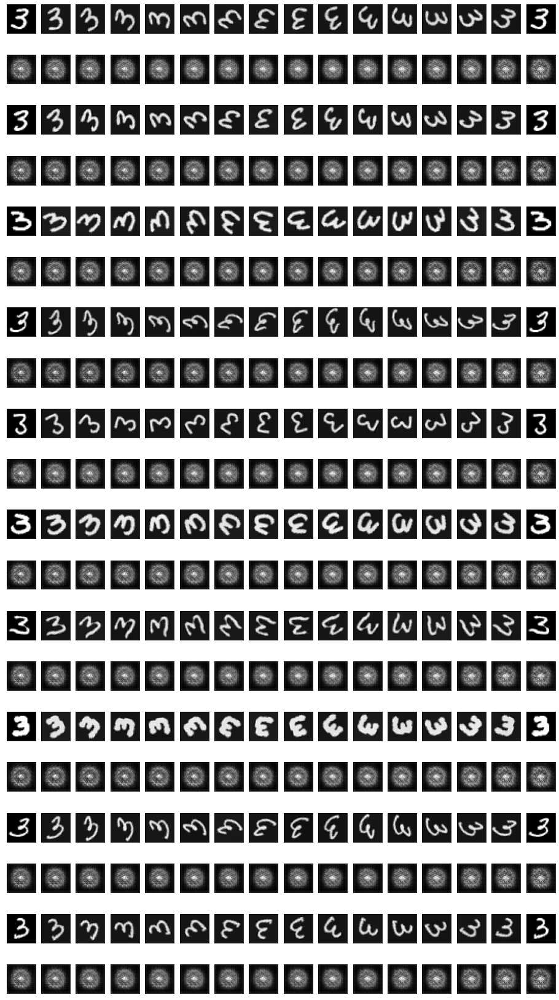

Epoch:   0/ 500 tr_elbo:132480.56  test_mse:0.057

Iter:0  lhood:-112580.12  kl_z:-204.24   kl_w: 9563.70
Iter:1  lhood:-117247.02  kl_z:223.24    kl_w: 9563.47
Iter:2  lhood:-112621.72  kl_z:18.55     kl_w: 9563.24
Iter:3  lhood:-111588.42  kl_z:-147.47   kl_w: 9563.01
Iter:4  lhood:-110717.80  kl_z:-95.84    kl_w: 9562.79
Iter:5  lhood:-113884.97  kl_z:-427.85   kl_w: 9562.56
Iter:6  lhood:-113415.77  kl_z:-404.09   kl_w: 9562.33
Iter:7  lhood:-111498.08  kl_z:-692.93   kl_w: 9562.08
Iter:8  lhood:-114493.04  kl_z:-725.25   kl_w: 9561.84
Iter:9  lhood:-112638.77  kl_z:-641.73   kl_w: 9561.59
Iter:10 lhood:-112809.30  kl_z:-314.30   kl_w: 9561.33
Iter:11 lhood:-112270.64  kl_z:-820.83   kl_w: 9561.07
Iter:12 lhood:-112729.15  kl_z:-899.97   kl_w: 9560.81
Iter:13 lhood:-111986.17  kl_z:-982.95   kl_w: 9560.57
Iter:14 lhood:-110692.92  kl_z:-673.55   kl_w: 9560.33
Iter:15 lhood:-110196.09  kl_z:-1328.67  kl_w: 9560.13
Iter:16 lhood:-111958.82  kl_z:-993.07   kl_w: 9559.94
Iter:17 lhood:

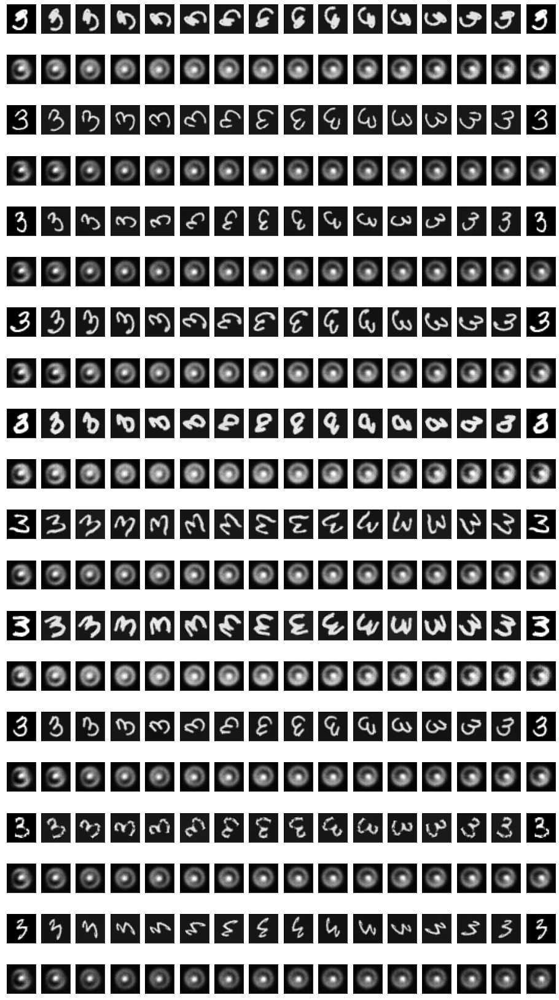

Epoch:  10/ 500 tr_elbo:107052.55  test_mse:0.047

Iter:0  lhood:-109950.92  kl_z:-2237.25  kl_w: 9526.85
Iter:1  lhood:-109145.41  kl_z:-2554.25  kl_w: 9526.67
Iter:2  lhood:-106503.77  kl_z:-2349.22  kl_w: 9526.48
Iter:3  lhood:-108228.88  kl_z:-2092.39  kl_w: 9526.28
Iter:4  lhood:-108352.88  kl_z:-2217.95  kl_w: 9526.09
Iter:5  lhood:-108797.45  kl_z:-2572.35  kl_w: 9525.89
Iter:6  lhood:-107992.97  kl_z:-2640.73  kl_w: 9525.70
Iter:7  lhood:-107768.55  kl_z:-2250.06  kl_w: 9525.50
Iter:8  lhood:-108346.17  kl_z:-2361.34  kl_w: 9525.34
Iter:9  lhood:-106104.30  kl_z:-2449.44  kl_w: 9525.17
Iter:10 lhood:-105513.19  kl_z:-2544.07  kl_w: 9525.00
Iter:11 lhood:-106998.39  kl_z:-1987.28  kl_w: 9524.83
Iter:12 lhood:-109734.73  kl_z:-2390.58  kl_w: 9524.66
Iter:13 lhood:-107524.91  kl_z:-2512.02  kl_w: 9524.48
Iter:14 lhood:-110473.22  kl_z:-2117.28  kl_w: 9524.30
Iter:15 lhood:-108535.95  kl_z:-2282.70  kl_w: 9524.12
Iter:16 lhood:-106762.06  kl_z:-2120.09  kl_w: 9523.94
Iter:17 lhood:

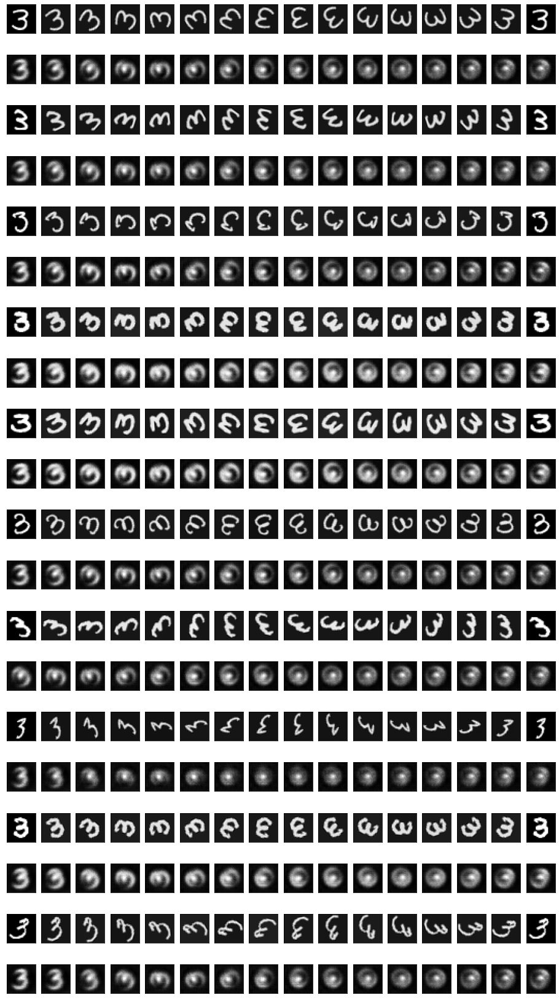

Epoch:  20/ 500 tr_elbo:99937.60  test_mse:0.040

Iter:0  lhood:-106355.04  kl_z:-3053.15  kl_w: 9488.68
Iter:1  lhood:-101878.19  kl_z:-2889.92  kl_w: 9488.48
Iter:2  lhood:-106299.34  kl_z:-2921.45  kl_w: 9488.29
Iter:3  lhood:-103624.08  kl_z:-2975.86  kl_w: 9488.08
Iter:4  lhood:-103487.64  kl_z:-2369.20  kl_w: 9487.88
Iter:5  lhood:-102834.34  kl_z:-3118.86  kl_w: 9487.67
Iter:6  lhood:-104190.67  kl_z:-2681.43  kl_w: 9487.46
Iter:7  lhood:-101800.59  kl_z:-2848.07  kl_w: 9487.27
Iter:8  lhood:-105159.30  kl_z:-2834.57  kl_w: 9487.07
Iter:9  lhood:-100923.44  kl_z:-2725.81  kl_w: 9486.86
Iter:10 lhood:-104398.58  kl_z:-2570.68  kl_w: 9486.65
Iter:11 lhood:-102970.77  kl_z:-2296.85  kl_w: 9486.44
Iter:12 lhood:-101313.70  kl_z:-2391.29  kl_w: 9486.22
Iter:13 lhood:-104342.67  kl_z:-2718.19  kl_w: 9486.01
Iter:14 lhood:-104962.02  kl_z:-2869.73  kl_w: 9485.80
Iter:15 lhood:-105118.97  kl_z:-2400.55  kl_w: 9485.59
Iter:16 lhood:-102800.89  kl_z:-2940.55  kl_w: 9485.42
Iter:17 lhood:-

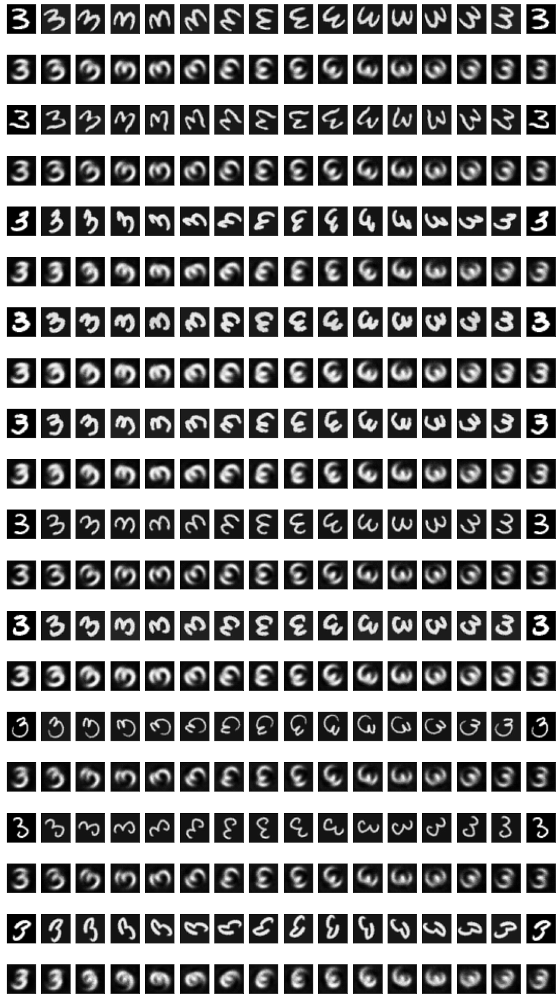

Epoch:  30/ 500 tr_elbo:99972.46  test_mse:0.033

Iter:0  lhood:-98190.30  kl_z:-3088.09  kl_w: 9449.41
Iter:1  lhood:-100865.90  kl_z:-3101.87  kl_w: 9449.23
Iter:2  lhood:-97787.85  kl_z:-2559.95  kl_w: 9449.08
Iter:3  lhood:-100101.00  kl_z:-3609.72  kl_w: 9448.93
Iter:4  lhood:-98870.08  kl_z:-2788.88  kl_w: 9448.78
Iter:5  lhood:-101343.08  kl_z:-2748.84  kl_w: 9448.62
Iter:6  lhood:-97991.32  kl_z:-3491.89  kl_w: 9448.46
Iter:7  lhood:-96811.99  kl_z:-2799.98  kl_w: 9448.30
Iter:8  lhood:-100070.69  kl_z:-2735.29  kl_w: 9448.14
Iter:9  lhood:-96878.72  kl_z:-2699.26  kl_w: 9447.98
Iter:10 lhood:-98416.80  kl_z:-2751.65  kl_w: 9447.81
Iter:11 lhood:-98793.35  kl_z:-2632.10  kl_w: 9447.63
Iter:12 lhood:-97926.91  kl_z:-2434.27  kl_w: 9447.46
Iter:13 lhood:-100293.61  kl_z:-2792.78  kl_w: 9447.28
Iter:14 lhood:-97607.78  kl_z:-3332.88  kl_w: 9447.10
Iter:15 lhood:-99254.02  kl_z:-3071.69  kl_w: 9446.92
Iter:16 lhood:-98870.09  kl_z:-3365.00  kl_w: 9446.73
Iter:17 lhood:-98465.56  kl

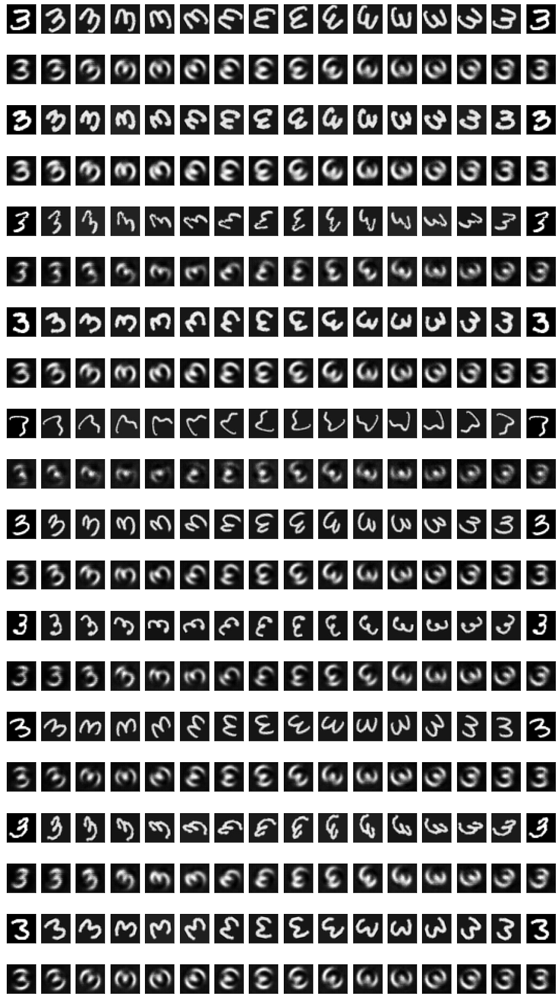

Epoch:  40/ 500 tr_elbo:94431.56  test_mse:0.033

Iter:0  lhood:-100009.64  kl_z:-2738.90  kl_w: 9408.18
Iter:1  lhood:-93659.91  kl_z:-3077.19  kl_w: 9407.97
Iter:2  lhood:-97170.71  kl_z:-2514.95  kl_w: 9407.75
Iter:3  lhood:-95450.14  kl_z:-2947.94  kl_w: 9407.53
Iter:4  lhood:-97906.48  kl_z:-2873.46  kl_w: 9407.31
Iter:5  lhood:-98889.70  kl_z:-3346.05  kl_w: 9407.08
Iter:6  lhood:-98333.67  kl_z:-3494.43  kl_w: 9406.85
Iter:7  lhood:-95428.53  kl_z:-3199.35  kl_w: 9406.61
Iter:8  lhood:-95943.59  kl_z:-3144.48  kl_w: 9406.40
Iter:9  lhood:-93883.66  kl_z:-2578.10  kl_w: 9406.18
Iter:10 lhood:-95456.50  kl_z:-3476.09  kl_w: 9405.96
Iter:11 lhood:-94030.55  kl_z:-3234.63  kl_w: 9405.76
Iter:12 lhood:-97498.16  kl_z:-2860.29  kl_w: 9405.54
Iter:13 lhood:-98083.39  kl_z:-2592.74  kl_w: 9405.31
Iter:14 lhood:-97499.37  kl_z:-2857.06  kl_w: 9405.08
Iter:15 lhood:-95284.05  kl_z:-3544.41  kl_w: 9404.84
Iter:16 lhood:-96191.58  kl_z:-3272.93  kl_w: 9404.60
Iter:17 lhood:-95968.35  kl_z:-

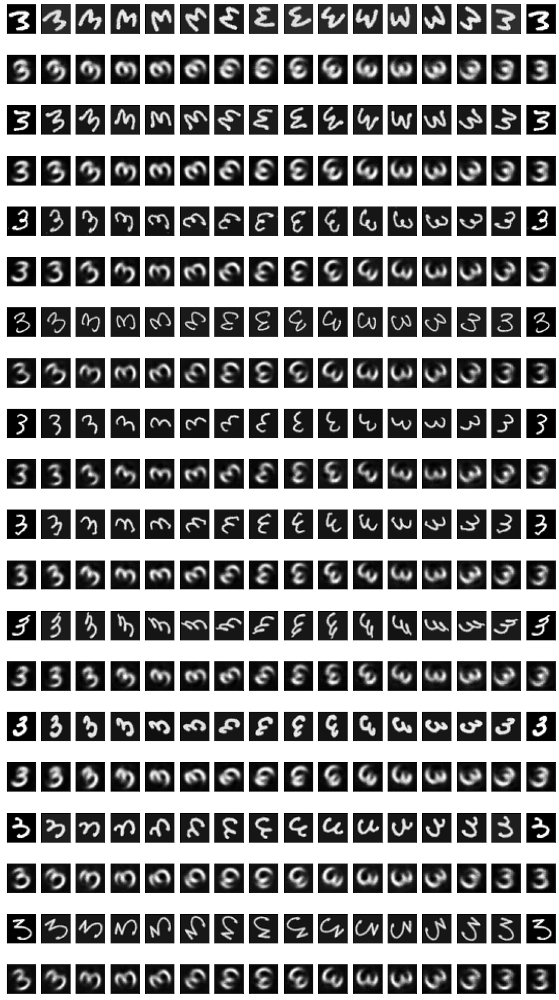

Epoch:  50/ 500 tr_elbo:87812.91  test_mse:0.030

Iter:0  lhood:-97110.58  kl_z:-3160.62  kl_w: 9363.48
Iter:1  lhood:-95720.80  kl_z:-3323.98  kl_w: 9363.27
Iter:2  lhood:-96593.30  kl_z:-3535.77  kl_w: 9363.05
Iter:3  lhood:-97921.49  kl_z:-3299.03  kl_w: 9362.83
Iter:4  lhood:-96970.08  kl_z:-3048.33  kl_w: 9362.61
Iter:5  lhood:-96961.86  kl_z:-3382.64  kl_w: 9362.38
Iter:6  lhood:-94794.05  kl_z:-3286.83  kl_w: 9362.16
Iter:7  lhood:-93742.34  kl_z:-3240.85  kl_w: 9361.96
Iter:8  lhood:-95539.73  kl_z:-3478.47  kl_w: 9361.75
Iter:9  lhood:-97280.09  kl_z:-3318.83  kl_w: 9361.55
Iter:10 lhood:-95887.85  kl_z:-2887.78  kl_w: 9361.35
Iter:11 lhood:-94684.72  kl_z:-2981.21  kl_w: 9361.14
Iter:12 lhood:-94881.48  kl_z:-3440.35  kl_w: 9360.92
Iter:13 lhood:-93505.93  kl_z:-3189.10  kl_w: 9360.70
Iter:14 lhood:-93206.71  kl_z:-3143.69  kl_w: 9360.47
Iter:15 lhood:-95018.34  kl_z:-3549.70  kl_w: 9360.24
Iter:16 lhood:-96841.49  kl_z:-2901.41  kl_w: 9360.00
Iter:17 lhood:-95282.20  kl_z:-2

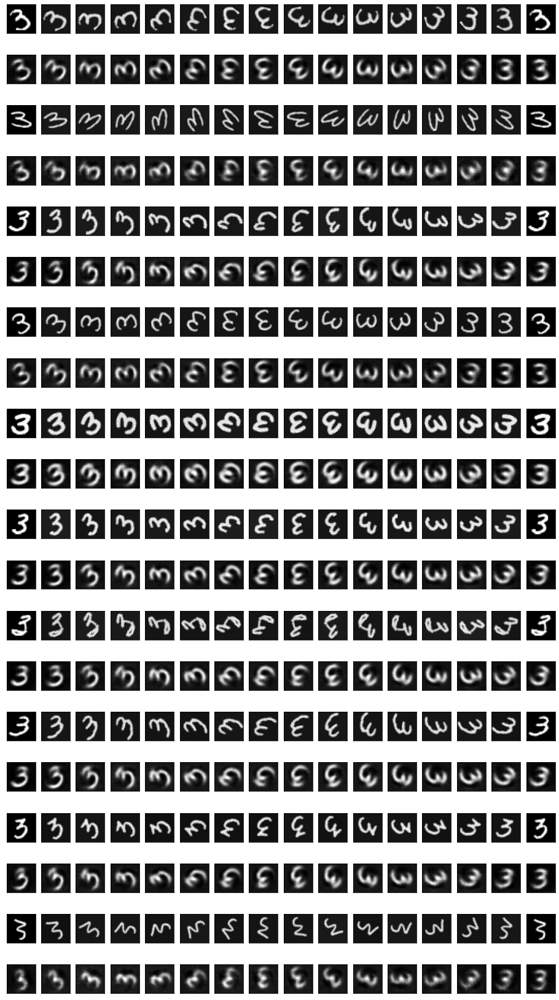

Epoch:  60/ 500 tr_elbo:91241.13  test_mse:0.029

Iter:0  lhood:-92377.23  kl_z:-3623.94  kl_w: 9315.31
Iter:1  lhood:-91982.23  kl_z:-3268.18  kl_w: 9315.04
Iter:2  lhood:-93352.34  kl_z:-3376.00  kl_w: 9314.79
Iter:3  lhood:-94853.70  kl_z:-3028.79  kl_w: 9314.52
Iter:4  lhood:-91347.91  kl_z:-3103.75  kl_w: 9314.25
Iter:5  lhood:-92612.82  kl_z:-3213.26  kl_w: 9313.99
Iter:6  lhood:-91422.47  kl_z:-3398.92  kl_w: 9313.73
Iter:7  lhood:-96587.70  kl_z:-2908.00  kl_w: 9313.46
Iter:8  lhood:-94880.78  kl_z:-3240.88  kl_w: 9313.19
Iter:9  lhood:-93607.90  kl_z:-3191.09  kl_w: 9312.92
Iter:10 lhood:-93236.96  kl_z:-3602.93  kl_w: 9312.63
Iter:11 lhood:-94304.64  kl_z:-3307.33  kl_w: 9312.36
Iter:12 lhood:-94838.17  kl_z:-3389.27  kl_w: 9312.08
Iter:13 lhood:-92060.24  kl_z:-3621.86  kl_w: 9311.81
Iter:14 lhood:-92739.65  kl_z:-2966.97  kl_w: 9311.53
Iter:15 lhood:-98380.62  kl_z:-3459.84  kl_w: 9311.27
Iter:16 lhood:-97838.81  kl_z:-3622.74  kl_w: 9311.01
Iter:17 lhood:-91454.70  kl_z:-3

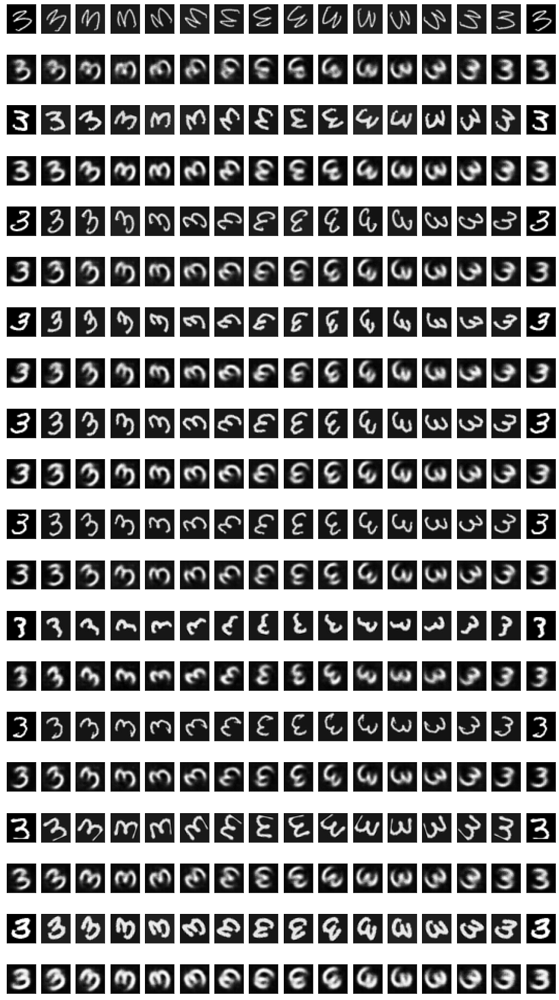

Epoch:  70/ 500 tr_elbo:86621.08  test_mse:0.025

Iter:0  lhood:-94099.76  kl_z:-2925.62  kl_w: 9262.01
Iter:1  lhood:-93453.66  kl_z:-2907.15  kl_w: 9261.75
Iter:2  lhood:-91514.93  kl_z:-2844.55  kl_w: 9261.49
Iter:3  lhood:-93997.80  kl_z:-2937.85  kl_w: 9261.23
Iter:4  lhood:-91616.50  kl_z:-3175.62  kl_w: 9260.96
Iter:5  lhood:-93512.04  kl_z:-3343.85  kl_w: 9260.69
Iter:6  lhood:-90221.56  kl_z:-3055.67  kl_w: 9260.42
Iter:7  lhood:-96171.11  kl_z:-3430.89  kl_w: 9260.15
Iter:8  lhood:-93525.84  kl_z:-3010.96  kl_w: 9259.88
Iter:9  lhood:-93057.26  kl_z:-3146.79  kl_w: 9259.60
Iter:10 lhood:-92906.27  kl_z:-3032.13  kl_w: 9259.33
Iter:11 lhood:-93365.46  kl_z:-3160.29  kl_w: 9259.04
Iter:12 lhood:-93921.34  kl_z:-3229.43  kl_w: 9258.75
Iter:13 lhood:-94327.81  kl_z:-3456.67  kl_w: 9258.46
Iter:14 lhood:-91458.09  kl_z:-3049.10  kl_w: 9258.17
Iter:15 lhood:-93366.84  kl_z:-3066.13  kl_w: 9257.89
Iter:16 lhood:-96807.20  kl_z:-3288.93  kl_w: 9257.60
Iter:17 lhood:-90211.38  kl_z:-3

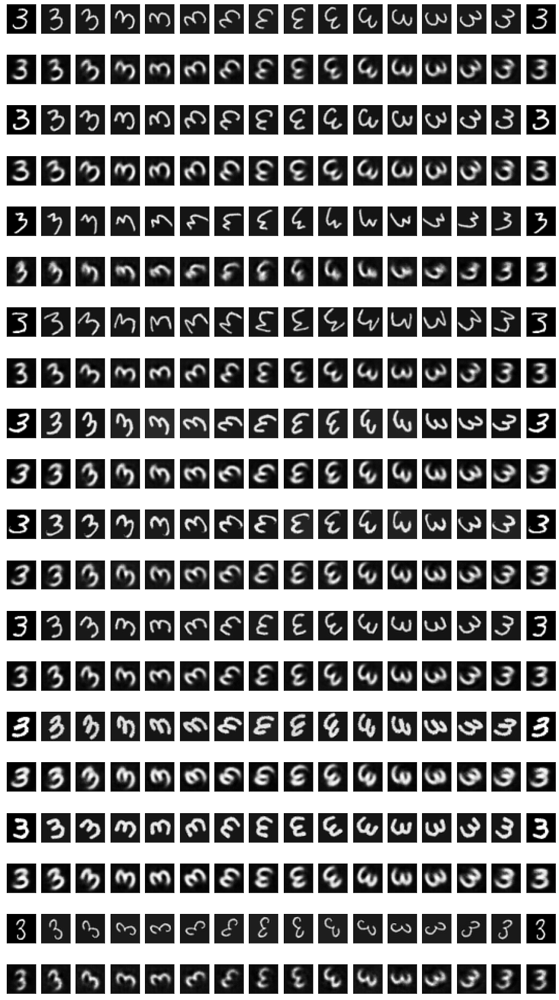

Epoch:  80/ 500 tr_elbo:84367.61  test_mse:0.023

Iter:0  lhood:-93354.92  kl_z:-2889.94  kl_w: 9202.28
Iter:1  lhood:-91842.88  kl_z:-3092.07  kl_w: 9201.96
Iter:2  lhood:-92381.01  kl_z:-3035.03  kl_w: 9201.64
Iter:3  lhood:-93637.92  kl_z:-2822.66  kl_w: 9201.31
Iter:4  lhood:-90986.36  kl_z:-3322.32  kl_w: 9200.99
Iter:5  lhood:-91024.22  kl_z:-3092.26  kl_w: 9200.66
Iter:6  lhood:-89187.07  kl_z:-2841.00  kl_w: 9200.33
Iter:7  lhood:-89905.47  kl_z:-2974.44  kl_w: 9199.99
Iter:8  lhood:-89430.66  kl_z:-3092.58  kl_w: 9199.65
Iter:9  lhood:-94143.44  kl_z:-3111.39  kl_w: 9199.32
Iter:10 lhood:-89921.52  kl_z:-3145.50  kl_w: 9198.98
Iter:11 lhood:-90601.61  kl_z:-3100.57  kl_w: 9198.67
Iter:12 lhood:-90878.34  kl_z:-2842.00  kl_w: 9198.35
Iter:13 lhood:-92836.97  kl_z:-3005.78  kl_w: 9198.03
Iter:14 lhood:-93688.19  kl_z:-3192.35  kl_w: 9197.70
Iter:15 lhood:-88926.67  kl_z:-2850.54  kl_w: 9197.36
Iter:16 lhood:-92923.84  kl_z:-3174.42  kl_w: 9197.02
Iter:17 lhood:-92188.58  kl_z:-2

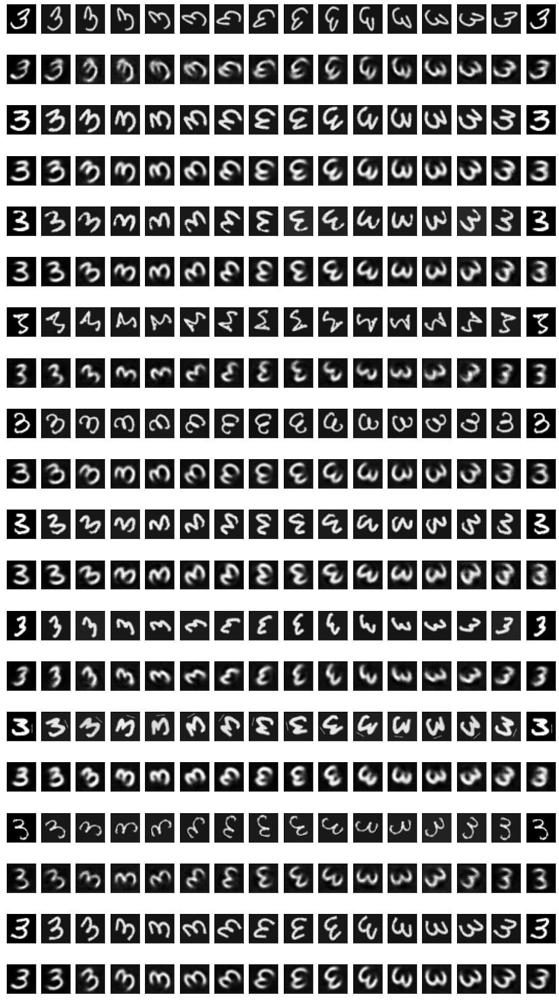

Epoch:  90/ 500 tr_elbo:83194.37  test_mse:0.026

Iter:0  lhood:-92922.73  kl_z:-3243.15  kl_w: 9136.48
Iter:1  lhood:-91448.16  kl_z:-3147.67  kl_w: 9136.16
Iter:2  lhood:-92487.52  kl_z:-3042.59  kl_w: 9135.82
Iter:3  lhood:-92365.00  kl_z:-3014.98  kl_w: 9135.49
Iter:4  lhood:-90333.21  kl_z:-3240.00  kl_w: 9135.16
Iter:5  lhood:-93799.23  kl_z:-3185.55  kl_w: 9134.83
Iter:6  lhood:-89226.53  kl_z:-3039.96  kl_w: 9134.48
Iter:7  lhood:-91939.42  kl_z:-3046.45  kl_w: 9134.14
Iter:8  lhood:-90340.30  kl_z:-2994.69  kl_w: 9133.79
Iter:9  lhood:-91684.48  kl_z:-3018.45  kl_w: 9133.44
Iter:10 lhood:-91437.11  kl_z:-2742.70  kl_w: 9133.09
Iter:11 lhood:-91556.48  kl_z:-2850.83  kl_w: 9132.75
Iter:12 lhood:-90706.52  kl_z:-2920.18  kl_w: 9132.40
Iter:13 lhood:-91084.13  kl_z:-3366.58  kl_w: 9132.05
Iter:14 lhood:-89389.28  kl_z:-3263.71  kl_w: 9131.71
Iter:15 lhood:-90747.31  kl_z:-3064.05  kl_w: 9131.37
Iter:16 lhood:-91686.80  kl_z:-2845.64  kl_w: 9131.01
Iter:17 lhood:-89410.30  kl_z:-3

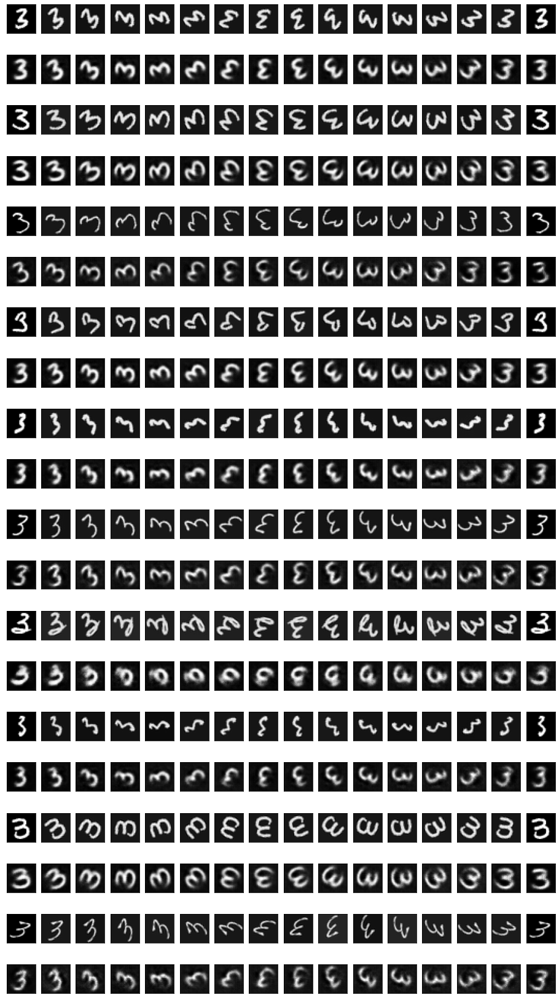

Epoch: 100/ 500 tr_elbo:78020.91  test_mse:0.021

Iter:0  lhood:-90243.80  kl_z:-2683.64  kl_w: 9063.44
Iter:1  lhood:-90553.22  kl_z:-2712.28  kl_w: 9063.05
Iter:2  lhood:-90571.39  kl_z:-2961.82  kl_w: 9062.67
Iter:3  lhood:-87930.93  kl_z:-2983.38  kl_w: 9062.27
Iter:4  lhood:-90798.98  kl_z:-3220.45  kl_w: 9061.88
Iter:5  lhood:-91566.49  kl_z:-2878.00  kl_w: 9061.49
Iter:6  lhood:-90125.75  kl_z:-2737.09  kl_w: 9061.09
Iter:7  lhood:-88903.50  kl_z:-3010.40  kl_w: 9060.70
Iter:8  lhood:-89105.53  kl_z:-2886.70  kl_w: 9060.30
Iter:9  lhood:-90907.35  kl_z:-3038.70  kl_w: 9059.91
Iter:10 lhood:-90248.16  kl_z:-3186.18  kl_w: 9059.51
Iter:11 lhood:-89011.23  kl_z:-2997.71  kl_w: 9059.15
Iter:12 lhood:-91261.67  kl_z:-2762.29  kl_w: 9058.78
Iter:13 lhood:-93525.17  kl_z:-2800.14  kl_w: 9058.41
Iter:14 lhood:-89980.54  kl_z:-2941.14  kl_w: 9058.03
Iter:15 lhood:-91980.43  kl_z:-3080.56  kl_w: 9057.64
Iter:16 lhood:-89906.45  kl_z:-2785.08  kl_w: 9057.25
Iter:17 lhood:-89613.99  kl_z:-2

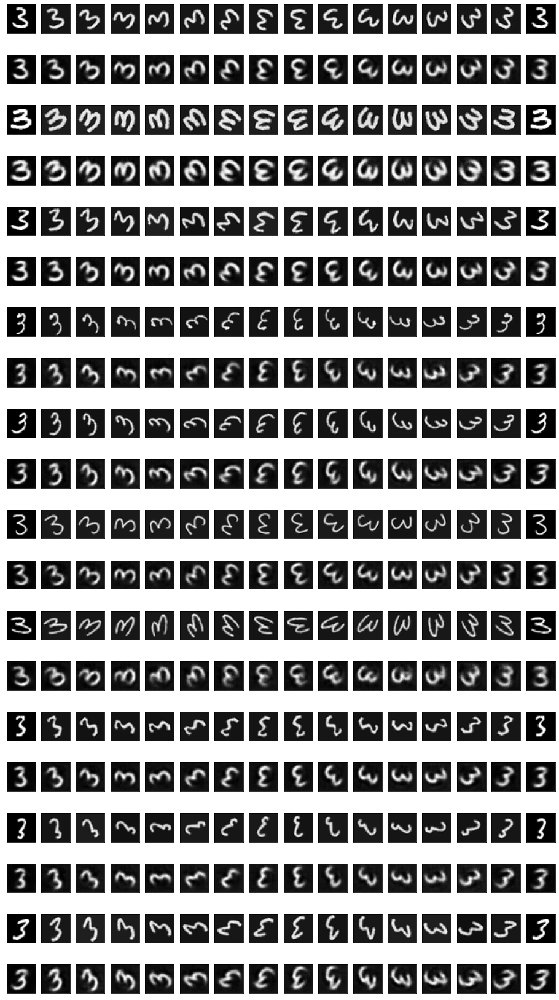

Epoch: 110/ 500 tr_elbo:78289.19  test_mse:0.021

Iter:0  lhood:-92345.14  kl_z:-2795.04  kl_w: 8984.18
Iter:1  lhood:-90324.78  kl_z:-2901.92  kl_w: 8983.77
Iter:2  lhood:-89361.73  kl_z:-2882.91  kl_w: 8983.37
Iter:3  lhood:-88817.84  kl_z:-2800.17  kl_w: 8982.97
Iter:4  lhood:-93291.50  kl_z:-2845.45  kl_w: 8982.57
Iter:5  lhood:-90473.53  kl_z:-2751.53  kl_w: 8982.17
Iter:6  lhood:-90681.00  kl_z:-3067.61  kl_w: 8981.77
Iter:7  lhood:-90214.05  kl_z:-3129.11  kl_w: 8981.36
Iter:8  lhood:-88721.47  kl_z:-2969.86  kl_w: 8980.95
Iter:9  lhood:-88354.02  kl_z:-2679.73  kl_w: 8980.54
Iter:10 lhood:-87779.75  kl_z:-2858.98  kl_w: 8980.12
Iter:11 lhood:-86926.71  kl_z:-2740.94  kl_w: 8979.69
Iter:12 lhood:-90651.60  kl_z:-2821.16  kl_w: 8979.26
Iter:13 lhood:-90667.16  kl_z:-2428.39  kl_w: 8978.83
Iter:14 lhood:-89114.62  kl_z:-2806.30  kl_w: 8978.40
Iter:15 lhood:-87766.80  kl_z:-2813.48  kl_w: 8977.97
Iter:16 lhood:-90681.39  kl_z:-2954.55  kl_w: 8977.54
Iter:17 lhood:-89814.17  kl_z:-3

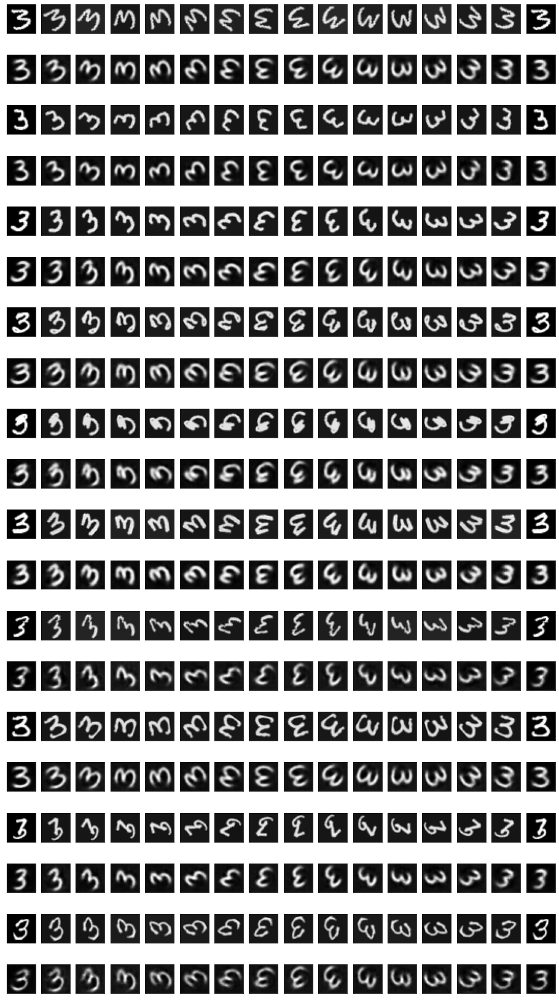

Epoch: 120/ 500 tr_elbo:73820.50  test_mse:0.020

Iter:0  lhood:-91854.84  kl_z:-2892.65  kl_w: 8898.37
Iter:1  lhood:-89866.16  kl_z:-2475.80  kl_w: 8897.89
Iter:2  lhood:-90894.59  kl_z:-2869.83  kl_w: 8897.42
Iter:3  lhood:-87473.59  kl_z:-2670.18  kl_w: 8896.98
Iter:4  lhood:-88198.84  kl_z:-2450.21  kl_w: 8896.54
Iter:5  lhood:-90227.52  kl_z:-2782.95  kl_w: 8896.08
Iter:6  lhood:-89205.00  kl_z:-2626.62  kl_w: 8895.65
Iter:7  lhood:-87451.34  kl_z:-2776.14  kl_w: 8895.21
Iter:8  lhood:-89459.13  kl_z:-2669.98  kl_w: 8894.78
Iter:9  lhood:-88633.79  kl_z:-2461.99  kl_w: 8894.34
Iter:10 lhood:-89546.84  kl_z:-2715.32  kl_w: 8893.89
Iter:11 lhood:-89953.12  kl_z:-2461.05  kl_w: 8893.44
Iter:12 lhood:-90184.84  kl_z:-3061.19  kl_w: 8892.99
Iter:13 lhood:-93913.59  kl_z:-2494.54  kl_w: 8892.55
Iter:14 lhood:-90070.09  kl_z:-2726.96  kl_w: 8892.10
Iter:15 lhood:-90630.63  kl_z:-2625.15  kl_w: 8891.65
Iter:16 lhood:-89742.03  kl_z:-2706.30  kl_w: 8891.20
Iter:17 lhood:-89740.38  kl_z:-2

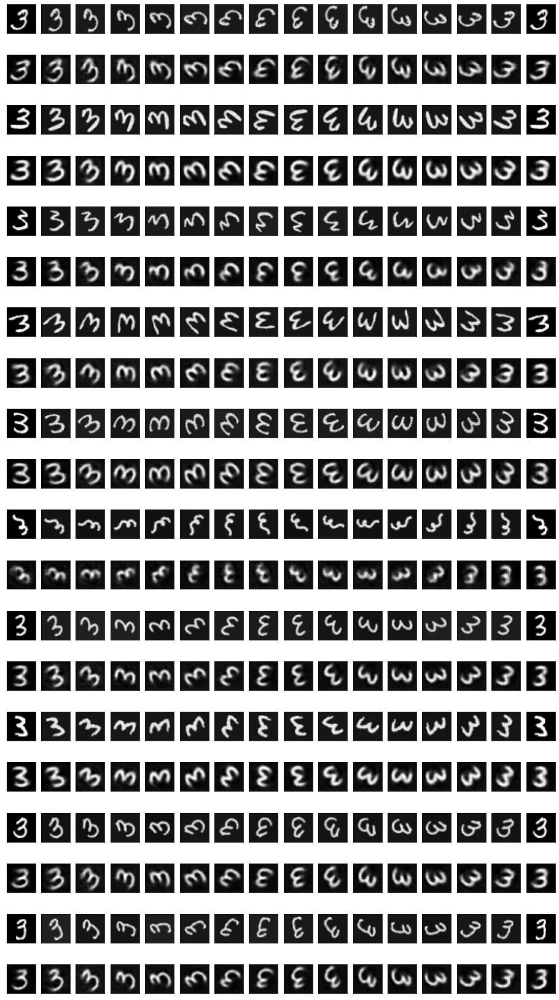

Epoch: 130/ 500 tr_elbo:75215.72  test_mse:0.020

Iter:0  lhood:-88806.38  kl_z:-2877.69  kl_w: 8805.36
Iter:1  lhood:-89258.04  kl_z:-2714.79  kl_w: 8804.90
Iter:2  lhood:-89044.53  kl_z:-2704.64  kl_w: 8804.45
Iter:3  lhood:-89200.20  kl_z:-2414.31  kl_w: 8804.00
Iter:4  lhood:-89444.91  kl_z:-2600.43  kl_w: 8803.53
Iter:5  lhood:-87412.59  kl_z:-2800.86  kl_w: 8803.08
Iter:6  lhood:-87822.41  kl_z:-2632.09  kl_w: 8802.62
Iter:7  lhood:-89585.24  kl_z:-2904.90  kl_w: 8802.17
Iter:8  lhood:-87110.58  kl_z:-2456.60  kl_w: 8801.72
Iter:9  lhood:-89209.10  kl_z:-2822.07  kl_w: 8801.27
Iter:10 lhood:-88061.23  kl_z:-2625.25  kl_w: 8800.81
Iter:11 lhood:-88525.87  kl_z:-2606.39  kl_w: 8800.35
Iter:12 lhood:-88638.98  kl_z:-2458.33  kl_w: 8799.89
Iter:13 lhood:-87699.70  kl_z:-2618.74  kl_w: 8799.43
Iter:14 lhood:-89067.39  kl_z:-2550.00  kl_w: 8798.95
Iter:15 lhood:-89873.22  kl_z:-2627.54  kl_w: 8798.47
Iter:16 lhood:-89585.05  kl_z:-2694.72  kl_w: 8797.99
Iter:17 lhood:-88199.91  kl_z:-2

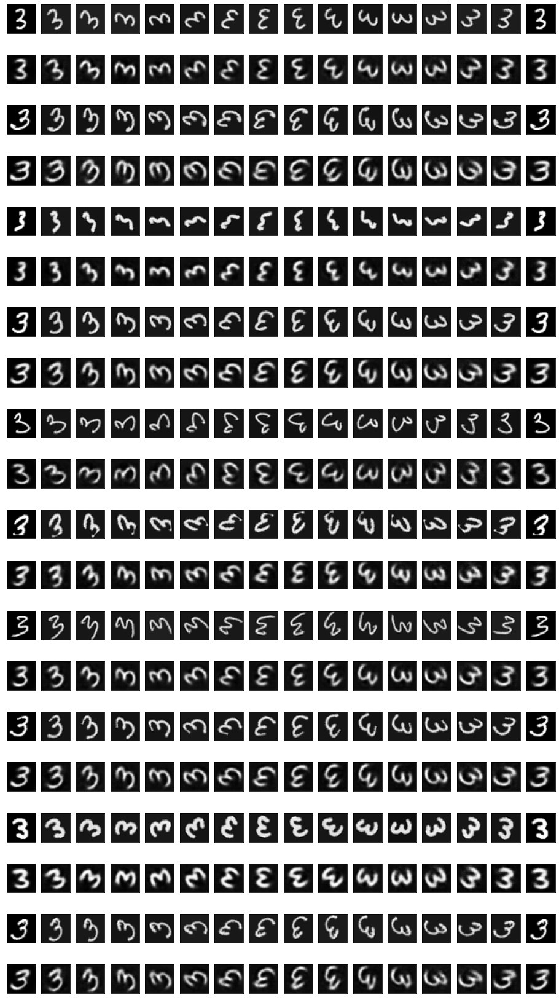

Epoch: 140/ 500 tr_elbo:72716.81  test_mse:0.022

Iter:0  lhood:-88889.20  kl_z:-2728.37  kl_w: 8702.88
Iter:1  lhood:-87947.67  kl_z:-2484.27  kl_w: 8702.35
Iter:2  lhood:-89512.38  kl_z:-2698.43  kl_w: 8701.82
Iter:3  lhood:-87960.59  kl_z:-2835.28  kl_w: 8701.28
Iter:4  lhood:-89722.41  kl_z:-2612.01  kl_w: 8700.74
Iter:5  lhood:-89035.32  kl_z:-2688.53  kl_w: 8700.19
Iter:6  lhood:-91662.10  kl_z:-2630.97  kl_w: 8699.64
Iter:7  lhood:-86784.73  kl_z:-2574.11  kl_w: 8699.12
Iter:8  lhood:-89176.27  kl_z:-2636.40  kl_w: 8698.59
Iter:9  lhood:-88062.43  kl_z:-2524.48  kl_w: 8698.07
Iter:10 lhood:-89438.04  kl_z:-2984.59  kl_w: 8697.55
Iter:11 lhood:-89709.17  kl_z:-2455.33  kl_w: 8697.03
Iter:12 lhood:-89525.90  kl_z:-2677.32  kl_w: 8696.52
Iter:13 lhood:-89075.58  kl_z:-2677.78  kl_w: 8696.00
Iter:14 lhood:-86876.56  kl_z:-2407.70  kl_w: 8695.47
Iter:15 lhood:-86339.38  kl_z:-2577.29  kl_w: 8694.94
Iter:16 lhood:-89355.02  kl_z:-2550.56  kl_w: 8694.41
Iter:17 lhood:-85760.45  kl_z:-2

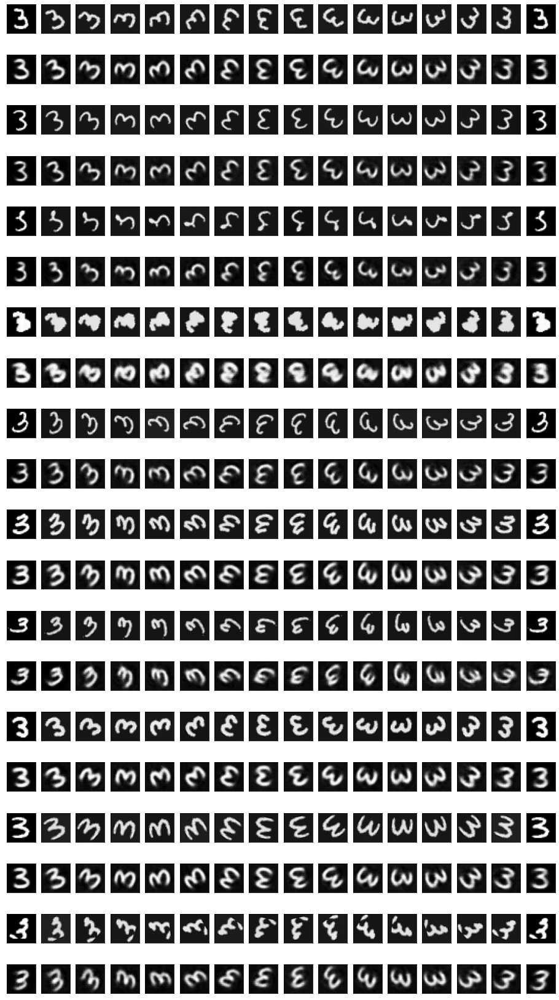

Epoch: 150/ 500 tr_elbo:73850.23  test_mse:0.021

Iter:0  lhood:-88792.28  kl_z:-2385.24  kl_w: 8593.81
Iter:1  lhood:-87258.88  kl_z:-3038.35  kl_w: 8593.25
Iter:2  lhood:-89868.17  kl_z:-2689.67  kl_w: 8592.68
Iter:3  lhood:-87075.47  kl_z:-2614.47  kl_w: 8592.11
Iter:4  lhood:-87487.67  kl_z:-2662.41  kl_w: 8591.55
Iter:5  lhood:-86898.97  kl_z:-2676.67  kl_w: 8590.98
Iter:6  lhood:-88721.84  kl_z:-2456.02  kl_w: 8590.41
Iter:7  lhood:-88961.27  kl_z:-2649.34  kl_w: 8589.84
Iter:8  lhood:-88736.32  kl_z:-2646.44  kl_w: 8589.26
Iter:9  lhood:-87944.02  kl_z:-2536.19  kl_w: 8588.70
Iter:10 lhood:-85538.25  kl_z:-2827.36  kl_w: 8588.13
Iter:11 lhood:-87477.14  kl_z:-2396.32  kl_w: 8587.56
Iter:12 lhood:-85939.12  kl_z:-2917.96  kl_w: 8586.99
Iter:13 lhood:-87191.24  kl_z:-2646.38  kl_w: 8586.41
Iter:14 lhood:-87552.34  kl_z:-2435.02  kl_w: 8585.83
Iter:15 lhood:-87335.31  kl_z:-2920.54  kl_w: 8585.25
Iter:16 lhood:-88878.74  kl_z:-2879.42  kl_w: 8584.67
Iter:17 lhood:-88965.27  kl_z:-2

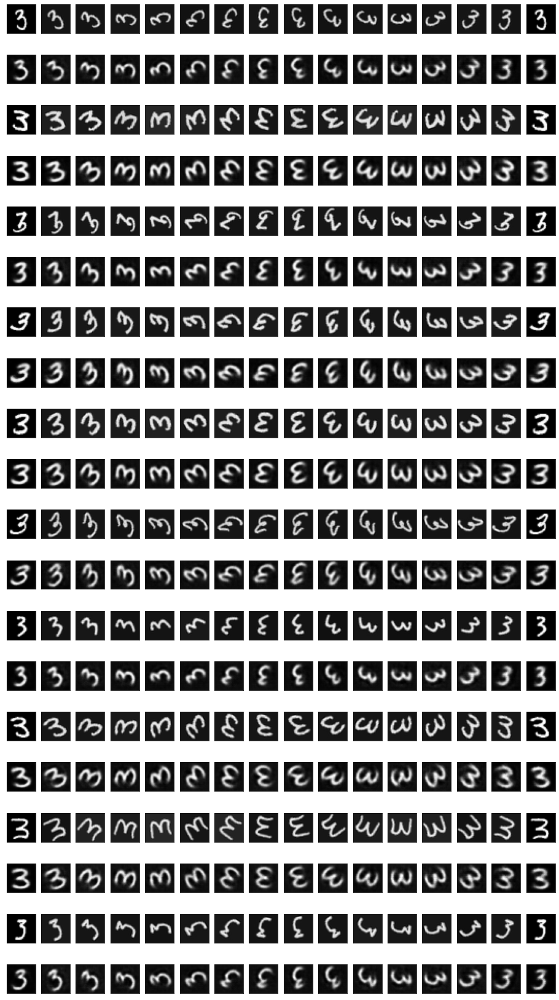

Epoch: 160/ 500 tr_elbo:69814.12  test_mse:0.020

Iter:0  lhood:-89181.50  kl_z:-2251.53  kl_w: 8476.40
Iter:1  lhood:-86569.75  kl_z:-3008.69  kl_w: 8475.80
Iter:2  lhood:-86727.85  kl_z:-2800.95  kl_w: 8475.20
Iter:3  lhood:-85065.22  kl_z:-2355.70  kl_w: 8474.59
Iter:4  lhood:-88315.62  kl_z:-2370.27  kl_w: 8474.02
Iter:5  lhood:-89157.43  kl_z:-2426.83  kl_w: 8473.43
Iter:6  lhood:-88723.74  kl_z:-2758.60  kl_w: 8472.85
Iter:7  lhood:-88017.50  kl_z:-2692.58  kl_w: 8472.25
Iter:8  lhood:-87561.47  kl_z:-2402.37  kl_w: 8471.66
Iter:9  lhood:-88375.82  kl_z:-2621.79  kl_w: 8471.07
Iter:10 lhood:-89430.40  kl_z:-2619.72  kl_w: 8470.49
Iter:11 lhood:-87063.40  kl_z:-2464.84  kl_w: 8469.90
Iter:12 lhood:-89735.09  kl_z:-2554.32  kl_w: 8469.31
Iter:13 lhood:-89713.19  kl_z:-2448.76  kl_w: 8468.74
Iter:14 lhood:-87178.84  kl_z:-2329.10  kl_w: 8468.16
Iter:15 lhood:-87174.34  kl_z:-2449.70  kl_w: 8467.58
Iter:16 lhood:-91002.12  kl_z:-2978.53  kl_w: 8467.00
Iter:17 lhood:-87797.56  kl_z:-2

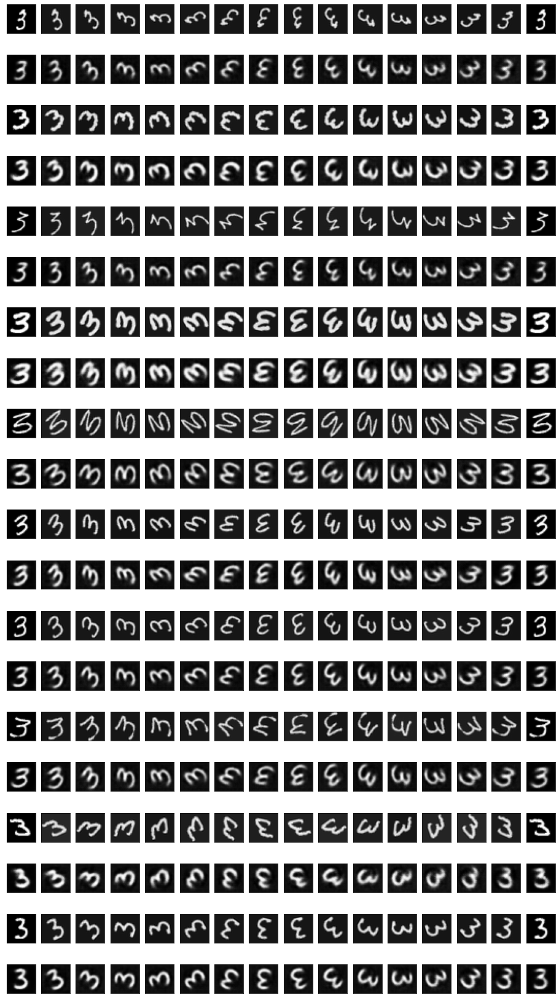

Epoch: 170/ 500 tr_elbo:70855.53  test_mse:0.020

Iter:0  lhood:-89218.27  kl_z:-2456.61  kl_w: 8351.63
Iter:1  lhood:-89131.25  kl_z:-2349.40  kl_w: 8350.97
Iter:2  lhood:-86134.05  kl_z:-2465.13  kl_w: 8350.31
Iter:3  lhood:-86741.41  kl_z:-2740.89  kl_w: 8349.66
Iter:4  lhood:-88274.30  kl_z:-2659.38  kl_w: 8349.01
Iter:5  lhood:-88030.04  kl_z:-2707.13  kl_w: 8348.36
Iter:6  lhood:-89147.55  kl_z:-2702.89  kl_w: 8347.71
Iter:7  lhood:-87144.88  kl_z:-2561.90  kl_w: 8347.06
Iter:8  lhood:-87482.20  kl_z:-2716.09  kl_w: 8346.39
Iter:9  lhood:-89396.49  kl_z:-2714.06  kl_w: 8345.73
Iter:10 lhood:-87523.84  kl_z:-2409.13  kl_w: 8345.08
Iter:11 lhood:-89617.07  kl_z:-2324.60  kl_w: 8344.43
Iter:12 lhood:-88117.02  kl_z:-2185.69  kl_w: 8343.79
Iter:13 lhood:-87558.75  kl_z:-2461.52  kl_w: 8343.14
Iter:14 lhood:-90016.73  kl_z:-2360.64  kl_w: 8342.50
Iter:15 lhood:-86659.86  kl_z:-2806.75  kl_w: 8341.85
Iter:16 lhood:-87570.73  kl_z:-2603.82  kl_w: 8341.21
Iter:17 lhood:-88406.95  kl_z:-2

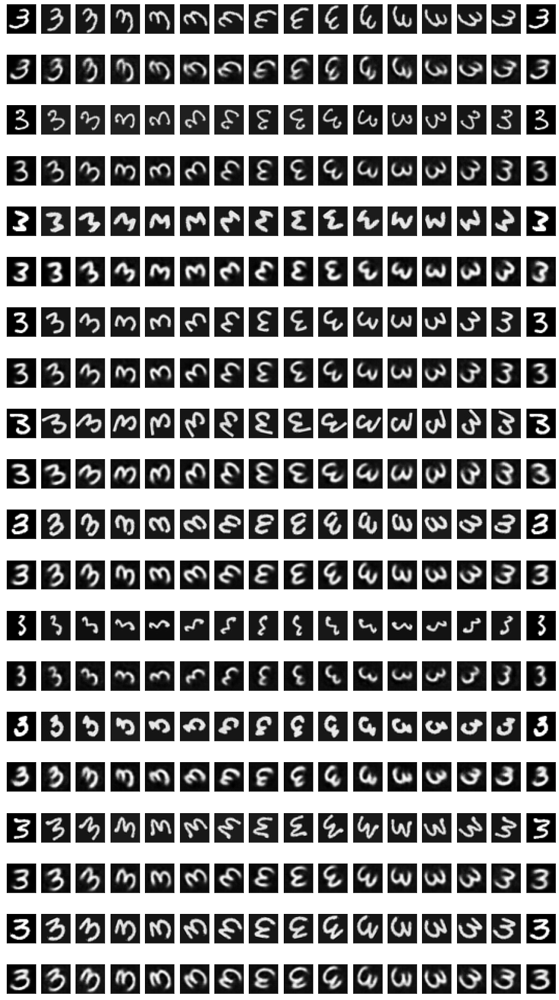

Epoch: 180/ 500 tr_elbo:68215.27  test_mse:0.018

Iter:0  lhood:-88097.57  kl_z:-2719.25  kl_w: 8219.21
Iter:1  lhood:-88762.20  kl_z:-2606.61  kl_w: 8218.49
Iter:2  lhood:-87792.97  kl_z:-2672.24  kl_w: 8217.78
Iter:3  lhood:-87441.73  kl_z:-2411.67  kl_w: 8217.07
Iter:4  lhood:-89233.82  kl_z:-2592.25  kl_w: 8216.36
Iter:5  lhood:-86098.92  kl_z:-2882.86  kl_w: 8215.66
Iter:6  lhood:-88066.61  kl_z:-2734.38  kl_w: 8214.96
Iter:7  lhood:-84495.23  kl_z:-2420.83  kl_w: 8214.26
Iter:8  lhood:-87973.08  kl_z:-2293.99  kl_w: 8213.56
Iter:9  lhood:-87538.04  kl_z:-2419.98  kl_w: 8212.85
Iter:10 lhood:-86618.23  kl_z:-2835.19  kl_w: 8212.13
Iter:11 lhood:-87515.09  kl_z:-2627.57  kl_w: 8211.42
Iter:12 lhood:-87916.12  kl_z:-2763.86  kl_w: 8210.71
Iter:13 lhood:-87779.12  kl_z:-2725.88  kl_w: 8209.99
Iter:14 lhood:-87209.42  kl_z:-2316.55  kl_w: 8209.28
Iter:15 lhood:-84310.75  kl_z:-2621.12  kl_w: 8208.57
Iter:16 lhood:-88621.80  kl_z:-2617.42  kl_w: 8207.85
Iter:17 lhood:-87480.82  kl_z:-2

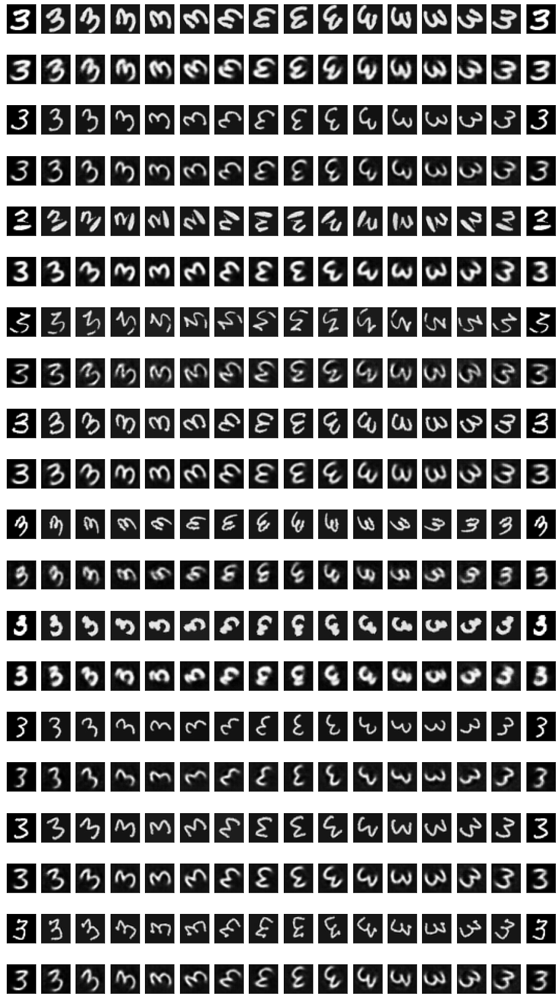

Epoch: 190/ 500 tr_elbo:69804.67  test_mse:0.017

Iter:0  lhood:-87214.75  kl_z:-2470.07  kl_w: 8077.82
Iter:1  lhood:-86665.64  kl_z:-2541.47  kl_w: 8077.10
Iter:2  lhood:-85073.63  kl_z:-2684.93  kl_w: 8076.37
Iter:3  lhood:-86486.88  kl_z:-2434.49  kl_w: 8075.64
Iter:4  lhood:-84958.92  kl_z:-2618.14  kl_w: 8074.90
Iter:5  lhood:-89841.65  kl_z:-2246.59  kl_w: 8074.16
Iter:6  lhood:-87735.05  kl_z:-3052.16  kl_w: 8073.40
Iter:7  lhood:-86486.88  kl_z:-2651.51  kl_w: 8072.66
Iter:8  lhood:-86565.92  kl_z:-2391.97  kl_w: 8071.92
Iter:9  lhood:-89262.02  kl_z:-2521.10  kl_w: 8071.18
Iter:10 lhood:-87405.27  kl_z:-2446.91  kl_w: 8070.45
Iter:11 lhood:-88682.14  kl_z:-2549.85  kl_w: 8069.72
Iter:12 lhood:-88105.42  kl_z:-2720.76  kl_w: 8068.98
Iter:13 lhood:-85446.09  kl_z:-2584.53  kl_w: 8068.25
Iter:14 lhood:-87187.12  kl_z:-2557.97  kl_w: 8067.52
Iter:15 lhood:-89178.63  kl_z:-2438.41  kl_w: 8066.79
Iter:16 lhood:-86567.95  kl_z:-2383.11  kl_w: 8066.05
Iter:17 lhood:-86772.98  kl_z:-2

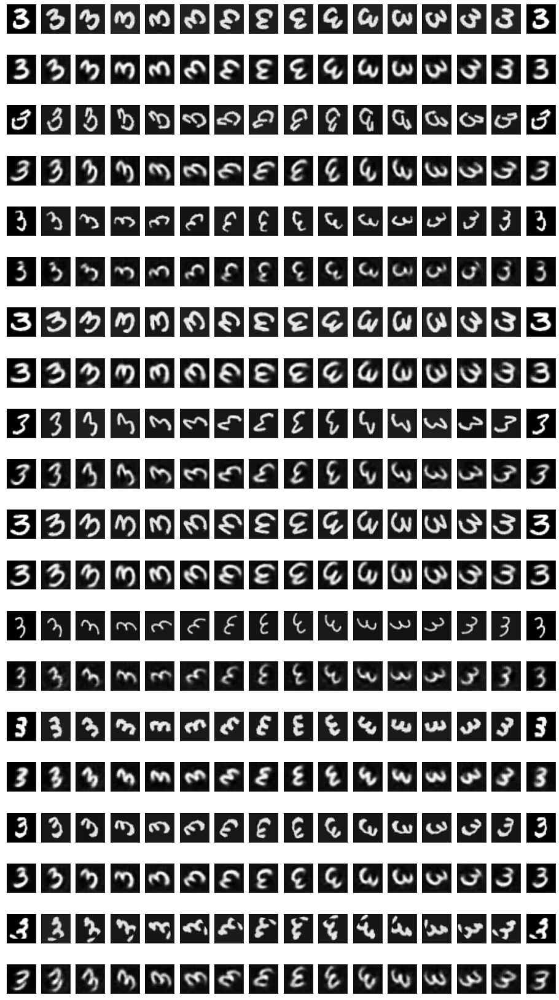

Epoch: 200/ 500 tr_elbo:71053.33  test_mse:0.020

Iter:0  lhood:-88435.42  kl_z:-2498.45  kl_w: 7926.98
Iter:1  lhood:-88075.48  kl_z:-2626.60  kl_w: 7926.21
Iter:2  lhood:-87404.50  kl_z:-2743.29  kl_w: 7925.44
Iter:3  lhood:-87355.64  kl_z:-2695.62  kl_w: 7924.67
Iter:4  lhood:-89207.25  kl_z:-2649.58  kl_w: 7923.90
Iter:5  lhood:-86212.30  kl_z:-2234.06  kl_w: 7923.13
Iter:6  lhood:-86851.25  kl_z:-2576.93  kl_w: 7922.36
Iter:7  lhood:-85828.89  kl_z:-2546.60  kl_w: 7921.58
Iter:8  lhood:-88808.90  kl_z:-2521.07  kl_w: 7920.78
Iter:9  lhood:-86445.67  kl_z:-2413.69  kl_w: 7920.00
Iter:10 lhood:-86897.55  kl_z:-2458.06  kl_w: 7919.21
Iter:11 lhood:-86378.43  kl_z:-2810.41  kl_w: 7918.43
Iter:12 lhood:-87552.82  kl_z:-2369.35  kl_w: 7917.65
Iter:13 lhood:-87775.31  kl_z:-2631.69  kl_w: 7916.87
Iter:14 lhood:-86986.49  kl_z:-2975.90  kl_w: 7916.10
Iter:15 lhood:-84022.48  kl_z:-2590.40  kl_w: 7915.33
Iter:16 lhood:-87604.99  kl_z:-2624.94  kl_w: 7914.55
Iter:17 lhood:-87504.93  kl_z:-2

KeyboardInterrupt: 

In [2]:
freeze_support()
ode2vae = ODE2VAE(q=8,n_filt=16).to(device)
Nepoch = 500
optimizer = torch.optim.Adam(ode2vae.parameters(),lr=1e-3)
for ep in range(Nepoch):
    L = 1 if ep<Nepoch//2 else 5 # increasing L as optimization proceeds is a good practice
    for i,local_batch in enumerate(trainset):
        minibatch = local_batch.to(device)
        elbo, lhood, kl_z, kl_w = ode2vae(minibatch, len(trainset), L=L, inst_enc=True, method='rk4')[4:]
        tr_loss = -elbo
        optimizer.zero_grad()
        tr_loss.backward()
        optimizer.step()
        print('Iter:{:<2d} lhood:{:8.2f}  kl_z:{:<8.2f}  kl_w:{:8.2f}'.\
            format(i, lhood.item(), kl_z.item(), kl_w.item()))
    with torch.set_grad_enabled(False):
        for test_batch in testset:
            test_batch = test_batch.to(device)
            Xrec_mu, test_mse = ode2vae.mean_rec(test_batch, method='rk4')
            if ep%10 == 0:
                plot_rot_mnist(test_batch, Xrec_mu)
            torch.save(ode2vae.state_dict(), 'ckpt_rotm_ode2vae.pth')
            break
    print('Epoch:{:4d}/{:4d} tr_elbo:{:8.2f}  test_mse:{:5.3f}\n'.format(ep, Nepoch, tr_loss.item(), test_mse.item()))

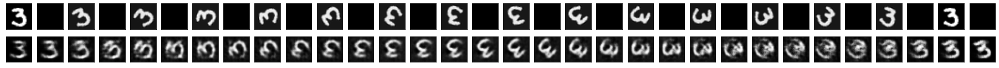

In [20]:
def plot_rot_mnist_ext(X, Xrec):
    N = min(X.shape[0],1)
    Xnp = X.detach().cpu().numpy()
    Xrecnp = Xrec.detach().cpu().numpy()
    T = X.shape[1]
    T2 = Xrec.shape[1]

    plt.figure(2,(2*T,2*N))
    for i in range(N):
        for t in range(T2):
            plt.subplot(2,32,i*T2*2+t+1)
            if t % 2 == 0:
                plt.imshow(np.reshape(Xnp[i,int(t/2)],[28,28]), cmap='gray')
            else:
                plt.imshow(np.ones((28, 28), dtype=np.float), cmap='gray')
            plt.xticks([]); plt.yticks([])
        for t in range(T2):
            plt.subplot(2,32,i*T2*2+t+T2+1)
            plt.imshow(np.reshape(Xrecnp[i,t],[28,28]), cmap='gray')
            plt.xticks([]); plt.yticks([])
    plt.show()
    plt.close()

with torch.set_grad_enabled(False):
    test_batch = next(iter(testset))
    test_batch = test_batch.to(device)
    Xrec_mu = ode2vae.mean_rec2(test_batch, method='rk4')
    plot_rot_mnist_ext(test_batch, Xrec_mu)